# PATHWAY ABUNDANCE (fr now this time please)

## step 1: get all the packages in

In [1]:
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import wesanderson
from matplotlib import font_manager
import scipy as sp

## step 2: load all necessary data

In [2]:
# bowtie hit summaries for propionate
compiled_bt_hit_summaries_allpathways = pd.read_csv("compiled_bt_hit_summaries_allpathways.csv")

# gene lengths 
allpathways_gene_catalogue_seqlengths = pd.read_csv("allpathways_gene_catalogue_seqlengths.csv").set_index("gene")

# gene information
allpathways_gene_info = pd.read_csv("allpathways_genesInCatalogue_long.csv")
allpathways_gene_info = allpathways_gene_info.drop(allpathways_gene_info.columns[0], axis=1).set_index("strain_gene")

## gene length correction (new, using formula proposed by RC, step 1 of it)

### the function for gene length correctin
note, this only does $hits\;of\;gene \cdot length(gene)$. The full formula is given as follows: $$

In [3]:
def gene_length_correction_new(gene_catalogue_seqlengths, compiled_bt_hit_summaries):

    gene_length_df = gene_catalogue_seqlengths

    df = compiled_bt_hit_summaries.drop(["pathway"], axis=1).set_index("read_accession")

    new = df.copy()

    # first replace the values in new with the gene length of that gene
    for gene in compiled_bt_hit_summaries:
        
        if gene in gene_length_df.index:
        
            gene_length = gene_length_df.loc[gene].at["length"]

            new[gene] = [gene_length] * len(new)

    # equivalent to hits of gene * length(gene)
    new = df.multiply(new)

    return new

### running the code for gene length correction

In [4]:
compiled_bt_hit_summaries_all_pathways_length_corrected = gene_length_correction_new(allpathways_gene_catalogue_seqlengths, compiled_bt_hit_summaries_allpathways)

## useful setup for calculating pathway abundances

In [5]:
abbreviations_dict = {
    "acetylCoA_buk": "Ace (buk)",
    "acetylCoA_but": "Ace (but)",
    "aminobutyrate_buk": "4-Ami (buk)",
    "aminobutyrate_but": "4-Ami (but)",
    "glutarate_buk": "Glu (buk)",
    "glutarate_but": "Glu (but)",
    "lysine": "Lys",
    "sodium-pumping decarboxylase": "SP",
    "Wood-Werkman Cycle": "WWC",
    "acrylate pathway": "Acr",
    "propanediol pathway": "Pro"
}

pathway_length_dict = {
    "Ace (buk)": 6,
    "Ace (but)": 5,
    "4-Ami (buk)": 6,
    "4-Ami (but)": 5,
    "Glu (buk)": 6,
    "Glu (but)": 5,
    "Lys": 7,
    "SP": 4,
    "WWC": 4,
    "Acr": 3,
    "Pro": 5
}

## calculating pathway abundances

### generate the dataframe to put everything in

## new approach: merge whatever RC has onto the final table

In [6]:
def add_genes_in_catalogue(hit_table, gene_info, gene_catalogue_seqlengths):

    temp = hit_table.transpose()

    temp = temp.merge(gene_info, how="left", left_index=True, right_index=True)

    strain = temp.pop("strain")
    temp.insert(0, strain.name, strain)

    pathway = temp.pop("pathway")
    temp.insert(1, pathway.name, pathway)

    gene = temp.pop("gene")
    temp.insert(2, gene.name, gene)

    strain_pathway = temp.pop("strain_pathway")
    temp.insert(3, strain_pathway.name, strain_pathway)

    temp = temp.merge(gene_catalogue_seqlengths, how="left", left_index=True, right_index=True)

    length = temp.pop("length")
    temp.insert(4, length.name, length)

    return temp

In [7]:
final_hit_table = add_genes_in_catalogue(compiled_bt_hit_summaries_all_pathways_length_corrected, allpathways_gene_info, allpathways_gene_catalogue_seqlengths)

## part 2 of length correction: dividing by number of hits for rplB

In [8]:
def length_correction_denominator(hit_table):

    # grouped = hit_table.groupby("overall_pathway").sum().drop(["strain", "pathway", "gene", "strain_pathway", "length"], axis=1)

    grouped = hit_table.groupby("strain_pathway").sum().drop(["strain", "pathway", "gene", "length"], axis=1)

    rplB_sum = grouped.loc["housekeeping"]

    not_samples = ["strain", "pathway", "gene", "strain_pathway", "length"]

    new = hit_table.copy

    for read in grouped:

        hit_table[read] /= rplB_sum[read]

    return hit_table

In [9]:
final_hit_table = length_correction_denominator(final_hit_table)

## this step is to normalise by proportion for the unknown samples

The formula for this normalisation is given as follows. Let $x$ be the amount of the mixed sample, $S_n$ be the known we are trying to approximate, and $S_i$ be the $i$-th known sample that is in the mixed sample. Let there be $n$ known samples in the mixed sample. As such, the total amount of $S_n$ can be given as follows:

$$actual\;amount\;of\;S_n = \frac{S_n}{\sum_{i=1}^{n} S_i} \cdot x$$

A function to perform this normalisation is given below.

In [10]:
def normalise_unknown(df):

    new = df.copy()

    unknown_samples = {
        "acetylCoA_buk or glutarate_buk": ["acetylCoA_buk", "glutarate_buk"],
        "aminobutyrate_but or acetylCoA_but": ["aminobutyrate_but", "acetylCoA_but"],
        "acetylCoA_buk or lysine": ["acetylCoA_buk", "lysine"],
        "acetylCoA_but or glutarate_but": ["acetylCoA_but", "glutarate_but"],
        "acetylCoA_but or glutarate_but or lysine": ["acetylCoA_but", "glutarate_but", "lysine"],
        "acetylCoA_but or lysine": ["acetylCoA_but", "lysine"],
        "aminobutyrate_buk or acetylCoA_buk": ["aminobutyrate_buk", "acetylCoA_buk"],
        "aminobutyrate_buk or acetylCoA_buk or lysine": ["aminobutyrate_buk", "acetylCoA_buk", "lysine"],
        "aminobutyrate_buk or lysine": ["aminobutyrate_buk", "lysine"],
        "aminobutyrate_but or acetylCoA_but": ["aminobutyrate_but", "acetylCoA_but"],
        "aminobutyrate_but or acetylCoA_but or glutarate_but": ["aminobutyrate_but", "acetylCoA_but", "glutarate_but"]
    }

    for sample in df:

        for pathway in list(df.index):

            if " or " in pathway:

                unknown_proportion = df.loc[pathway].at[sample]

                if unknown_proportion == 0: break

                components_list = unknown_samples[pathway]
                proportion_dict = {}
                denominator = 0
                
                for component in components_list:

                    if df.loc[component].at[sample] != 0:

                        proportion_dict[component] = df.loc[component].at[sample]
                        denominator += proportion_dict[component]

                if len(proportion_dict) > 1:

                    for component in components_list:

                        new.loc[component].at[sample] = proportion_dict[component] + ((proportion_dict[component] / denominator) * unknown_proportion)

    new = new.drop(list(unknown_samples.keys()))

    return new

Now, actually implement the `normalisation_unknown` function on actual data

First, perform some preprocessing of the data

In [11]:
overall_pathway_group = final_hit_table.groupby(["strain_pathway"]).sum()

overall_pathway_group = overall_pathway_group.drop(["strain", "pathway", "gene", "length"], axis=1).drop(["housekeeping"], axis=0)

Then, actually implement everything.

In [12]:
noramlised_unknown_overall_pathway_group = normalise_unknown(overall_pathway_group)

noramlised_unknown_overall_pathway_group = noramlised_unknown_overall_pathway_group.transpose()

noramlised_unknown_overall_pathway_group = noramlised_unknown_overall_pathway_group.reindex(columns= ["acetylCoA_buk", "acetylCoA_but", "aminobutyrate_buk", "aminobutyrate_but", "glutarate_buk", "glutarate_but", "lysine", "sodium-pumping decarboxylase", "Wood-Werkman Cycle", "acrylate pathway", "propanediol pathway"])

noramlised_unknown_overall_pathway_group

strain_pathway,acetylCoA_buk,acetylCoA_but,aminobutyrate_buk,aminobutyrate_but,glutarate_buk,glutarate_but,lysine,sodium-pumping decarboxylase,Wood-Werkman Cycle,acrylate pathway,propanediol pathway
ERR4330026,0.720267,0.859171,0.026902,0.007952,1.255438,0.004717,0.271120,0.000000,0.003478,0.002479,1.508643
ERR4330027,0.182759,2.056273,0.035831,0.004202,0.000000,0.021767,0.276666,0.058329,0.003516,0.029038,0.308419
ERR4330028,0.497137,2.454502,0.054360,0.008471,0.431394,0.000000,0.389992,0.032511,0.062410,0.014608,0.176322
ERR4330029,0.178006,2.111748,0.047619,0.014103,0.000000,0.000000,0.324417,0.000644,0.062969,0.020944,0.126641
ERR4330030,0.460613,3.270901,0.016298,0.029065,0.000000,0.003407,0.304302,0.000000,0.002673,0.045897,0.504274
...,...,...,...,...,...,...,...,...,...,...,...
SRR5983481,0.086979,0.434198,0.105879,0.005773,0.000000,0.013853,0.166586,0.013919,0.124583,0.013775,0.173110
SRR5983482,0.265809,3.096981,0.087407,0.000000,0.000000,0.006395,0.142704,0.000000,0.054937,0.000000,0.021033
SRR5983483,0.550594,3.738645,0.000000,0.008304,0.000000,0.005362,0.000000,0.007390,0.637586,0.000000,0.361560
SRR5983484,0.116455,0.025934,0.000000,0.000000,0.000000,0.000000,0.803756,0.000000,0.143084,0.000000,0.039348


### fixing column names to the abbreviations

In [13]:
for column in noramlised_unknown_overall_pathway_group:
    noramlised_unknown_overall_pathway_group.rename(columns = {column:abbreviations_dict[column]}, inplace = True)

noramlised_unknown_overall_pathway_group

strain_pathway,Ace (buk),Ace (but),4-Ami (buk),4-Ami (but),Glu (buk),Glu (but),Lys,SP,WWC,Acr,Pro
ERR4330026,0.720267,0.859171,0.026902,0.007952,1.255438,0.004717,0.271120,0.000000,0.003478,0.002479,1.508643
ERR4330027,0.182759,2.056273,0.035831,0.004202,0.000000,0.021767,0.276666,0.058329,0.003516,0.029038,0.308419
ERR4330028,0.497137,2.454502,0.054360,0.008471,0.431394,0.000000,0.389992,0.032511,0.062410,0.014608,0.176322
ERR4330029,0.178006,2.111748,0.047619,0.014103,0.000000,0.000000,0.324417,0.000644,0.062969,0.020944,0.126641
ERR4330030,0.460613,3.270901,0.016298,0.029065,0.000000,0.003407,0.304302,0.000000,0.002673,0.045897,0.504274
...,...,...,...,...,...,...,...,...,...,...,...
SRR5983481,0.086979,0.434198,0.105879,0.005773,0.000000,0.013853,0.166586,0.013919,0.124583,0.013775,0.173110
SRR5983482,0.265809,3.096981,0.087407,0.000000,0.000000,0.006395,0.142704,0.000000,0.054937,0.000000,0.021033
SRR5983483,0.550594,3.738645,0.000000,0.008304,0.000000,0.005362,0.000000,0.007390,0.637586,0.000000,0.361560
SRR5983484,0.116455,0.025934,0.000000,0.000000,0.000000,0.000000,0.803756,0.000000,0.143084,0.000000,0.039348


### normalisation with respect to the length of each pathway

In [14]:
for pathway in noramlised_unknown_overall_pathway_group:

    if pathway in pathway_length_dict.keys():

        noramlised_unknown_overall_pathway_group[pathway] /= pathway_length_dict[pathway]

noramlised_unknown_overall_pathway_group = noramlised_unknown_overall_pathway_group.transpose()

noramlised_unknown_overall_pathway_group

,ERR4330026,ERR4330027,ERR4330028,ERR4330029,ERR4330030,ERR4330031,ERR4330032,ERR4330033,ERR4330034,ERR4330035,...,SRR5983476,SRR5983477,SRR5983478,SRR5983479,SRR5983480,SRR5983481,SRR5983482,SRR5983483,SRR5983484,SRR5983485
strain_pathway,,,,,,,,,,,,,,,,,,,,,
Ace (buk),0.120044,0.030460,0.082856,0.029668,0.076769,0.104892,0.055441,0.037328,0.028076,0.076823,...,0.034071,0.010897,0.005153,0.025930,0.045887,0.014497,0.044301,0.091766,0.019409,0.023508
Ace (but),0.171834,0.411255,0.490900,0.422350,0.654180,0.368834,0.292922,0.475446,0.326735,0.299806,...,0.454364,0.501834,0.307657,0.102018,0.362353,0.086840,0.619396,0.747729,0.005187,0.609470
4-Ami (buk),0.004484,0.005972,0.009060,0.007937,0.002716,0.005731,0.006947,0.008761,0.011412,0.030777,...,0.027909,0.002999,0.003224,0.049006,0.013791,0.017647,0.014568,0.000000,0.000000,0.001034
4-Ami (but),0.001590,0.000840,0.001694,0.002821,0.005813,0.001826,0.003259,0.006270,0.000000,0.000000,...,0.000000,0.002857,0.000000,0.002052,0.002115,0.001155,0.000000,0.001661,0.000000,0.000000
Glu (buk),0.209240,0.000000,0.071899,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Glu (but),0.000943,0.004353,0.000000,0.000000,0.000681,0.001757,0.000843,0.000258,0.000000,0.000205,...,0.001313,0.002219,0.000158,0.006035,0.002976,0.002771,0.001279,0.001072,0.000000,0.000598
Lys,0.038731,0.039524,0.055713,0.046345,0.043472,0.148956,0.016510,0.013875,0.011816,0.215860,...,0.106262,0.002047,0.025491,0.051751,0.011479,0.023798,0.020386,0.000000,0.114822,0.002679
SP,0.000000,0.014582,0.008128,0.000161,0.000000,0.156325,0.000381,0.000000,0.000000,0.064010,...,0.000778,0.099207,0.000000,0.000000,0.003050,0.003480,0.000000,0.001848,0.000000,0.000000
WWC,0.000870,0.000879,0.015602,0.015742,0.000668,0.000000,0.000000,0.181202,0.007674,0.001531,...,0.096117,0.010061,0.005373,1.450839,0.178596,0.031146,0.013734,0.159396,0.035771,0.080591


### now add what the actual final pathways are

In [15]:
def find_pathway(df):

    new = df.copy()

    prop_pathways = ["SP", "WWC", "Pro", "Acr"]

    butyrate_pathways = ["Ace (buk)", "4-Ami (buk)", "Lys", "Glu (but)", "Glu (buk)", "Ace (but)", "4-Ami (but)"]

    pathway_result = []

    for path in list(new.index):

        if path in prop_pathways: pathway_result.append("propionate")

        if path in butyrate_pathways: pathway_result.append("butyrate")

    new.insert(0, "overall_pathway", pathway_result)

    return new

In [16]:
prop_but_groupby = find_pathway(noramlised_unknown_overall_pathway_group).groupby(["overall_pathway"]).sum()

prop_but_groupby

,ERR4330026,ERR4330027,ERR4330028,ERR4330029,ERR4330030,ERR4330031,ERR4330032,ERR4330033,ERR4330034,ERR4330035,...,SRR5983476,SRR5983477,SRR5983478,SRR5983479,SRR5983480,SRR5983481,SRR5983482,SRR5983483,SRR5983484,SRR5983485
overall_pathway,,,,,,,,,,,,,,,,,,,,,
butyrate,0.546867,0.492404,0.712123,0.509120,0.783632,0.631994,0.375921,0.541939,0.378039,0.623472,...,0.623919,0.522852,0.341682,0.236792,0.43860,0.146706,0.699931,0.842228,0.139418,0.637289
propionate,0.303424,0.086825,0.063864,0.048213,0.116822,0.238845,0.080945,0.353189,0.053627,0.101362,...,0.106824,0.205070,0.007134,1.685581,0.28863,0.073839,0.017941,0.233556,0.043641,0.098807


### add the stuff about metadata + species 

first load the species stuff in

In [17]:
# # Load curated microbiome data
# 
# The original data is provided in R. Here, we use only the abundance data, provided in easily to handle csv files (subfolder data_curated_microbiome). The abundance levels were extracted from metagenomics using https://github.com/biobakery/MetaPhlAn.
# 
#big table with abundance of different species across all thousands of samples from the data collection
relab=pd.read_csv("data_curated_microbiome/relabundance.csv")
relab.rename(columns={'Unnamed: 0': 'tax_identifier'},inplace=True) # Gives first column label "tax_identifier"
display(relab.head(3)) 

#information about samples
colnames=pd.read_csv("data_curated_microbiome/relabundance_colData.csv")
colnames.rename(columns={'Unnamed: 0': 'sample'},inplace=True) # Gives name to first column

#information about different species detected in the different samples
rownames=pd.read_csv("data_curated_microbiome/relabundance_rowData.csv")
rownames.rename(columns={'Unnamed: 0': 'tax_identifier'},inplace=True)

#add species information to major data table. Used for groupby analysis later on
#relab.join
relab2 = relab.merge(rownames, on='tax_identifier', how='inner')  # Rows = species, Cols = Samples + species info
display(relab2.head(3))

,tax_identifier,MV_FEI1_t1Q14,MV_FEI2_t1Q14,MV_FEI3_t1Q14,MV_FEI4_t1Q14,MV_FEI4_t2Q15,MV_FEI5_t1Q14,MV_FEI5_t2Q14,MV_FEI5_t3Q15,MV_FEM1_t1Q14,...,wHAXPI034926-15,wHAXPI037144-8,wHAXPI037145-9,wHAXPI037146-11,wHAXPI037147-12,wHAXPI043592-8,wHAXPI043593-9,wHAXPI043594-11,wHAXPI047830-11,wHAXPI048670-90
0,Escherichia coli,59.35010,0.00000,85.42333,46.70438,0.54770,0.0,0.02243,0.00000,0.00000,...,0.02811,0.41802,3.13657,1.26867,2.79116,0.07465,0.10713,0.40001,0.45324,6.05846
1,Bifidobacterium bifidum,16.16243,5.61882,0.20192,0.00000,26.63938,0.0,0.00000,19.20307,0.13643,...,0.00000,0.00000,0.00000,2.37212,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
2,Bifidobacterium longum,7.79189,60.54102,0.49524,0.00000,0.00000,0.0,0.00000,28.51001,0.05094,...,0.33410,0.39197,0.09752,3.19180,0.18976,0.00330,0.55654,0.69706,2.61017,0.03886


/tmp/ipykernel_2201497/2568771729.py:11: DtypeWarning: Columns (21,22,27,29,30,33,36,43,50,52,53,54,55,56,57,62,63,70,72,76,77,87,90,98,99,102,106,107,108,109,111,114,115,116,123) have mixed types. Specify dtype option on import or set low_memory=False.
  colnames=pd.read_csv("data_curated_microbiome/relabundance_colData.csv")


,tax_identifier,MV_FEI1_t1Q14,MV_FEI2_t1Q14,MV_FEI3_t1Q14,MV_FEI4_t1Q14,MV_FEI4_t2Q15,MV_FEI5_t1Q14,MV_FEI5_t2Q14,MV_FEI5_t3Q15,MV_FEM1_t1Q14,...,wHAXPI043594-11,wHAXPI047830-11,wHAXPI048670-90,superkingdom,phylum,class,order,family,genus,species
0,Escherichia coli,59.35010,0.00000,85.42333,46.70438,0.54770,0.0,0.02243,0.00000,0.00000,...,0.40001,0.45324,6.05846,Bacteria,Proteobacteria,Gammaproteobacteria,Enterobacterales,Enterobacteriaceae,Escherichia,Escherichia coli
1,Bifidobacterium bifidum,16.16243,5.61882,0.20192,0.00000,26.63938,0.0,0.00000,19.20307,0.13643,...,0.00000,0.00000,0.00000,Bacteria,Actinobacteria,Actinomycetia,Bifidobacteriales,Bifidobacteriaceae,Bifidobacterium,Bifidobacterium bifidum
2,Bifidobacterium longum,7.79189,60.54102,0.49524,0.00000,0.00000,0.0,0.00000,28.51001,0.05094,...,0.69706,2.61017,0.03886,Bacteria,Actinobacteria,Actinomycetia,Bifidobacteriales,Bifidobacteriaceae,Bifidobacterium,Bifidobacterium longum


### attempt to add the HMP samples with IBD

In [18]:
HMP_2019_runInfo = pd.read_csv("data_curated_microbiome/HMP_2019_runInfo.csv").set_index("Sample")
HMP_2019_summary = pd.read_csv("data_curated_microbiome/HMP_2019_summary.csv").set_index("Sample Accession")

In [19]:
print(len(list(HMP_2019_runInfo["bases"])))

print(len(list(HMP_2019_runInfo["bases"].unique())))

# print(len(list(HMP_2019_summary["Sample Accession"].unique())))


3357
3356


#### here I perform the most scuffed join of all time
I join everything on number of bases because that's the only column that both have, and is entirely unique. Good news: 

In [20]:
HMP_2019_runInfo = HMP_2019_runInfo[["Run"]]

HMP_2019_summary = HMP_2019_summary.merge(HMP_2019_runInfo, how="left", left_index=True, right_index=True)

HMP_2019_summary = HMP_2019_summary.set_index("Total Bases")

HMP_2019_summary = HMP_2019_summary[["Run"]]

HMP_2019_summary

,Run
Total Bases,
2363597386,SRR5983436
3243376740,SRR5983437
3266450934,SRR5983438
3058708177,SRR5983439
2258081562,SRR5983440
...,...
2116260126,SRR5936105
1084698271,SRR5936102
1945093294,SRR5935740


In [123]:
temp = pd.read_csv("data_curated_microbiome/nayfach_asnicar_hmp_metadata.csv").set_index("number_bases")

temp

temp = temp.merge(HMP_2019_summary, how="left", left_index=True, right_index=True)

# list(temp)

In [124]:
print(temp.columns.values.tolist())

['Unnamed: 0', 'study_name', 'subject_id', 'antibiotics_current_use', 'study_condition', 'disease', 'age', 'infant_age', 'age_category', 'gender', 'country', 'non_westernized', 'number_reads', 'NCBI_accession', 'pregnant', 'lactating', 'BMI', 'family', 'days_from_first_collection', 'family_role', 'born_method', 'feeding_practice', 'location', 'visit_number', 'antibiotics_family', 'disease_subtype', 'days_after_onset', 'creatine', 'albumine', 'hscrp', 'ast', 'alt', 'globulin', 'urea_nitrogen', 'population', 'triglycerides', 'hdl', 'ldl', 'hba1c', 'Run']


In [125]:
temp

,Unnamed: 0,study_name,subject_id,antibiotics_current_use,study_condition,disease,age,infant_age,age_category,gender,...,ast,alt,globulin,urea_nitrogen,population,triglycerides,hdl,ldl,hba1c,Run
number_bases,,,,,,,,,,,,,,,,,,,,,
1565347,HSM7J4QJ,HMP_2019_ibdmdb,H4015,no,IBD,IBD,15.0,NaN,schoolage,male,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7957630,CSM79HPU,HMP_2019_ibdmdb,C3013,no,IBD,IBD,26.0,NaN,adult,female,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8698365,MSM5LLDU,HMP_2019_ibdmdb,M2008,no,IBD,IBD,30.0,NaN,adult,female,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22075158,PSM7J177,HMP_2019_ibdmdb,P6028,yes,IBD,IBD,9.0,NaN,child,male,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23913357,HSMA33IO,HMP_2019_ibdmdb,H4042,no,IBD,IBD,15.0,NaN,schoolage,male,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SRR5946983
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9984905804,SAMEA7045248,AsnicarF_2021,predict1_MTG_0394,no,control,healthy,54.0,NaN,adult,male,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10453084928,SAMEA7045696,AsnicarF_2021,predict1_MTG_0842,no,control,healthy,30.0,NaN,adult,female,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11042291911,SAMEA7045506,AsnicarF_2021,predict1_MTG_0652,no,control,healthy,25.0,NaN,adult,female,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [129]:
accession = []

ncbi_list = list(temp.NCBI_accession)

run_list = list(temp.Run)

for i in range(len(ncbi_list)):

    if type(ncbi_list[i]) == str:
        value = ncbi_list[i]
    elif type(run_list[i]) == str:
        value = run_list[i]
        
    accession.append(value)

temp["NCBI_accession"] = accession

HMP_data = temp.loc[temp["study_name"] == "HMP_2019_ibdmdb"]

In [131]:
HMP_list = HMP_data.NCBI_accession

with open(r'HMP_accessions.txt', 'w') as fp:
    for item in HMP_list:
        # write each item on a new line
        fp.write("%s\n" % item)
    print('Done')

Done


now add the metadata in

In [83]:
metadata = pd.read_csv("data_curated_microbiome/nayfach_asnicar_hmp_metadata.csv").set_index("NCBI_accession")

temp = prop_but_groupby.transpose()

with_metadata_prop_but_normalised = temp.merge(metadata, how="left", left_index=True, right_index=True)

with_metadata_prop_but_normalised.to_csv("output/with_metadata_prop_but_normalised.csv")

In [84]:
temp = noramlised_unknown_overall_pathway_group.transpose()

with_metadata_overall_group_normalised = temp.merge(metadata, how="left", left_index=True, right_index=True)

with_metadata_overall_group_normalised.to_csv("output/with_metadata_overall_group_normalised")

In [92]:
temp

,Unnamed: 0,study_name,subject_id,antibiotics_current_use,study_condition,disease,age,infant_age,age_category,gender,...,ast,alt,globulin,urea_nitrogen,population,triglycerides,hdl,ldl,hba1c,Run
0,MV_FEI1_t1Q14,AsnicarF_2017,MV_FEI1,NaN,control,healthy,0.0,90.0,newborn,female,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,MV_FEI2_t1Q14,AsnicarF_2017,MV_FEI2,NaN,control,healthy,0.0,90.0,newborn,male,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,MV_FEI3_t1Q14,AsnicarF_2017,MV_FEI3,NaN,control,healthy,0.0,90.0,newborn,male,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,MV_FEI4_t1Q14,AsnicarF_2017,MV_FEI4,NaN,control,healthy,1.0,NaN,child,male,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,MV_FEI4_t2Q15,AsnicarF_2017,MV_FEI4,NaN,control,healthy,1.0,NaN,child,male,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3579,HMP2_J43842_M_ST_T0_B0_0120_ZTLUDS8-1015_C93B2...,HMP_2019_t2d,ZTLUDS8,NaN,IGT,IGT;respiratoryinf,50.0,NaN,adult,male,...,32.0,35.0,33.0,5.355002,Caucasian,69.0,88.0,152.0,4.7,NaN
3580,HMP2_J43843_M_ST_T0_B0_0120_ZTLUDS8-1013-AL1_C...,HMP_2019_t2d,ZTLUDS8,NaN,IGT,IGT;respiratoryinf,50.0,NaN,adult,male,...,NaN,NaN,NaN,NaN,Caucasian,NaN,NaN,NaN,NaN,NaN
3581,HMP2_J43844_M_ST_T0_B0_0120_ZL9BTWF-1022_C93B2...,HMP_2019_t2d,ZL9BTWF,NaN,IGT,IGT;respiratoryinf,65.0,NaN,adult,male,...,39.0,63.0,25.0,4.998001,Caucasian,77.0,49.0,109.0,5.6,NaN
3582,HMP2_J43845_M_ST_T0_B0_0120_ZL9BTWF-1023-AL2_C...,HMP_2019_t2d,ZL9BTWF,NaN,IGT,IGT;respiratoryinf,65.0,NaN,adult,male,...,NaN,NaN,NaN,NaN,Caucasian,NaN,NaN,NaN,NaN,NaN


## RELOAD DATA HERE

In [24]:
with_metadata_prop_but_normalised = pd.read_csv("output/with_metadata_prop_but_normalised.csv").set_index("Unnamed: 0.1")

with_metadata_overall_group_normalised = pd.read_csv("output/with_metadata_overall_group_normalised").set_index("Unnamed: 0.1")

### now lets normalise for percentage

`percentageNormaliseOne` does normalisation correctly if there is no metadata attached

`percentageNormaliseOne` does normalisation correctly only if there is metadata attached, and the data is only for propionate vs butyrate

In [13]:
def percentageNormaliseOne(df):

    new = df.copy()

    summed = df.sum(axis=0)

    for row in df.index:

        new.loc[row] = df.loc[row].div(summed)

    return new

def percentageNormaliseTwo(df):

    summed = df.butyrate.add(df.propionate)

    for pathway in ["butyrate", "propionate"]:

        pathway_name = pathway+"_percent"
        
        df[pathway_name] = df[pathway].div(summed)

        df.loc[~np.isfinite(df[pathway_name]), pathway_name] = np.nan

    return df.transpose()

## BASICALLY THE FINAL TABLE THAT I NEED FOR PROP VS BUT

this does the percentage normalisation, then does the minus metric stuff

In [87]:
with_metadata_prop_but_percent_change = percentageNormaliseTwo(with_metadata_prop_but_normalised)

with_metadata_prop_but_percent_change.loc["BTR % - PROP %"] = with_metadata_prop_but_percent_change.loc["butyrate_percent"] - with_metadata_prop_but_percent_change.loc["propionate_percent"]

with_metadata_prop_but_percent_change.loc["BTR - PROP"] = with_metadata_prop_but_percent_change.loc["butyrate"] - with_metadata_prop_but_percent_change.loc["propionate"]

with_metadata_prop_but_percent_change = with_metadata_prop_but_percent_change.transpose()

this adds my own binning for age

In [88]:
age_category_list = []

index = 0

for sample in with_metadata_prop_but_percent_change.age:

    if sample <=1:
        if with_metadata_prop_but_percent_change.infant_age[index] <= 30:
            age_category_list.append("Newborn")
        else:
            age_category_list.append("Infant")

    elif sample > 1 and sample <=12: age_category_list.append("Child")

    elif sample > 12 and sample < 18: age_category_list.append("Adolescent")

    elif sample >= 18 and sample < 65: age_category_list.append("Adult")

    elif sample >= 65: age_category_list.append("Older Adult")

    else: age_category_list.append(np.nan)

    index += 1

with_metadata_prop_but_percent_change["age_category"] = age_category_list

with_metadata_prop_but_percent_change = with_metadata_prop_but_percent_change.rename(columns={"infant_age": "Infant Age (days)"})

now save everything

In [89]:
with_metadata_prop_but_percent_change.to_csv("output/with_metadata_prop_but_percent_change")

## RELOAD THE DATA HERE

In [25]:
with_metadata_prop_but_percent_change = pd.read_csv("output/with_metadata_prop_but_percent_change").set_index("Unnamed: 0.1")

with_metadata_prop_but_percent_change

,butyrate,propionate,Unnamed: 0,study_name,subject_id,antibiotics_current_use,study_condition,disease,age,Infant Age (days),...,urea_nitrogen,population,triglycerides,hdl,ldl,hba1c,butyrate_percent,propionate_percent,BTR % - PROP %,BTR - PROP
Unnamed: 0.1,,,,,,,,,,,,,,,,,,,,,
ERR4330026,0.546867,0.303424,SAMEA7041133,AsnicarF_2021,predict1_MTG_0001,no,control,healthy,36.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.643153,0.356847,0.286305,0.243443
ERR4330027,0.492404,0.086825,SAMEA7041134,AsnicarF_2021,predict1_MTG_0002,no,control,healthy,24.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.850103,0.149897,0.700206,0.405579
ERR4330028,0.712123,0.063864,SAMEA7041135,AsnicarF_2021,predict1_MTG_0003,no,control,healthy,63.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.917700,0.082300,0.835400,0.648259
ERR4330029,0.509120,0.048213,SAMEA7041136,AsnicarF_2021,predict1_MTG_0004,no,control,healthy,53.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.913493,0.086507,0.826987,0.460907
ERR4330030,0.783632,0.116822,SAMEA7041137,AsnicarF_2021,predict1_MTG_0005,no,control,healthy,38.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.870263,0.129737,0.740526,0.666809
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR5983481,0.146706,0.073839,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.665198,0.334802,0.330395,0.072867
SRR5983482,0.699931,0.017941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.975008,0.024992,0.950016,0.681990
SRR5983483,0.842228,0.233556,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.782897,0.217103,0.565794,0.608672


In [29]:
healthy_overall_group_noramlised = with_metadata_overall_group_normalised.loc[with_metadata_overall_group_normalised['disease'] == "healthy"]

healthy_prop_but_noramlised = with_metadata_prop_but_percent_change.loc[with_metadata_prop_but_percent_change['disease'] == "healthy"]

adult_healthy_overall_group_normalised = healthy_overall_group_noramlised.loc[healthy_overall_group_noramlised["age"] >= 18]

adult_health_prop_but_normalised = with_metadata_prop_but_percent_change.loc[with_metadata_prop_but_percent_change["age"] >= 18]

In [27]:
healthy_prop_but_noramlised

,butyrate,propionate,Unnamed: 0,study_name,subject_id,antibiotics_current_use,study_condition,disease,age,Infant Age (days),...,urea_nitrogen,population,triglycerides,hdl,ldl,hba1c,butyrate_percent,propionate_percent,BTR % - PROP %,BTR - PROP
Unnamed: 0.1,,,,,,,,,,,,,,,,,,,,,
ERR4330026,0.546867,0.303424,SAMEA7041133,AsnicarF_2021,predict1_MTG_0001,no,control,healthy,36.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.643153,0.356847,0.286305,0.243443
ERR4330027,0.492404,0.086825,SAMEA7041134,AsnicarF_2021,predict1_MTG_0002,no,control,healthy,24.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.850103,0.149897,0.700206,0.405579
ERR4330028,0.712123,0.063864,SAMEA7041135,AsnicarF_2021,predict1_MTG_0003,no,control,healthy,63.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.917700,0.082300,0.835400,0.648259
ERR4330029,0.509120,0.048213,SAMEA7041136,AsnicarF_2021,predict1_MTG_0004,no,control,healthy,53.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.913493,0.086507,0.826987,0.460907
ERR4330030,0.783632,0.116822,SAMEA7041137,AsnicarF_2021,predict1_MTG_0005,no,control,healthy,38.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.870263,0.129737,0.740526,0.666809
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR4052040,0.002375,0.541648,MV_FEI5_t1Q14,AsnicarF_2017,MV_FEI5,NaN,control,healthy,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.004365,0.995635,-0.991270,-0.539274
SRR4052041,0.080828,2.243016,MV_FEI5_t2Q14,AsnicarF_2017,MV_FEI5,NaN,control,healthy,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.034782,0.965218,-0.930436,-2.162188
SRR4052042,0.359526,0.053221,MV_FEI5_t3Q15,AsnicarF_2017,MV_FEI5,NaN,control,healthy,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.871057,0.128943,0.742115,0.306306


#### make the stuff to account for phylum

In [67]:
phylum_df = relab2.groupby("phylum").sum().drop(["superkingdom", "class", "order", "family", "genus", "species"], axis=1).reset_index().set_index("phylum").drop(["tax_identifier"], axis=1)

temp = phylum_df.transpose()

metadata = pd.read_csv("data_curated_microbiome/nayfach_asnicar_hmp_metadata.csv").drop(["infant_age", "age_category", "gender", "country", "non_westernized", "BMI"], axis=1).set_index("Unnamed: 0")

with_phylum = metadata.merge(temp, how="left", left_index=True, right_index=True).reset_index().set_index("NCBI_accession")

bacteroides_vs_firmicutes = with_phylum[["Bacteroidetes", "Firmicutes"]]

bacteroides_vs_firmicutes = bacteroides_vs_firmicutes.reindex(["Firmicutes", "Bacteroidetes"], axis="columns").transpose()

adult_healthy_bacteroides_vs_firmicutes = with_phylum[["Bacteroidetes", "Firmicutes", "age", "disease"]]

adult_healthy_bacteroides_vs_firmicutes = adult_healthy_bacteroides_vs_firmicutes.loc[adult_healthy_bacteroides_vs_firmicutes["age"] >= 18]

adult_healthy_bacteroides_vs_firmicutes = adult_healthy_bacteroides_vs_firmicutes.loc[adult_healthy_bacteroides_vs_firmicutes["disease"] == "healthy"]

adult_healthy_bacteroides_vs_firmicutes = adult_healthy_bacteroides_vs_firmicutes.drop(["age", "disease"], axis=1).reindex(["Firmicutes", "Bacteroidetes"], axis="columns").transpose()

adult_healthy_bacteroides_vs_firmicutes

NCBI_accession,ERR4330026,ERR4330027,ERR4330028,ERR4330029,ERR4330030,ERR4330031,ERR4330032,ERR4330033,ERR4330034,ERR4330035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Firmicutes,27.71216,41.37050,43.70317,33.88667,59.64222,43.99187,31.28870,64.93870,47.43638,19.93554,...,40.81189,40.81189,34.80516,16.60278,70.69821,23.55446,12.91173,14.40073,19.82514,7.50164
Bacteroidetes,64.86127,54.68318,34.64965,61.13726,35.83284,48.15292,63.60274,32.86029,36.27032,68.64813,...,52.41069,52.41069,54.72260,62.00960,12.49631,74.76680,83.72354,82.94298,79.21469,90.54810


## random plots testing time

### custom fonts because why not I'm annoying like that

In [30]:
font_dirs = ["Hind"]
font_files = font_manager.findSystemFonts(fontpaths=font_dirs)

for font_file in font_files:
    font_manager.fontManager.addfont(font_file)

# set font
plt.rcParams['font.family'] = "Hind"

### defining functions to make some basic stacked bar plots

In [54]:
def stackedBarDF(overall_pathway_df):

    temp_table = overall_pathway_df.transpose()

    temp_dict = {}

    for column in temp_table:

        temp_dict[column] = temp_table[column].tolist()

    samples_list = list(temp_table.index.values)

    plottingDF = pd.DataFrame(
        temp_dict,
        index = samples_list
    )

    return plottingDF.fillna(0) 

def plotStackedBar(stackedBarDF, name="overall pathway groupby", x_name="samples"):

    mpl.rcParams.update(mpl.rcParamsDefault)
    n = len(stackedBarDF.columns)
    colors = plt.cm.viridis(np.linspace(0, 1, n))

    plt.rcParams.update({'font.size': 33})
    plt.tight_layout()
    plt.rcParams['figure.dpi']=600
    plt.rcParams['font.family'] = "Hind"
    
    return stackedBarDF.plot(kind="bar", stacked=True, color=colors, figsize=(13,7), xlabel=x_name, ylabel="relative pathway abundance", title=name, xticks=([])).legend(loc="center left", bbox_to_anchor=(1, 0.5))
    
def sortedStackedBar(stackedBarDF, sortBy, auto_name=False, x_name="samples"):

    # stackedBarDF = stackedBarDF[["butyrate_percent", "propionate_percent"]] if percent else stackedBarDF[["BTR", "PROP"]]
    
    name = "Sorted by abundance of " + sortBy if not auto_name else ""

    return plotStackedBar(stackedBarDF.sort_values(by=sortBy), name, x_name)

### defining stuff for scatter plots

In [9]:
def plotScatter(scatterDF, x_data, y_data):

    plt.rcParams.update({'font.size': 23})
    plt.tight_layout()
    plt.rcParams['figure.dpi']=600
    sns.set_style("darkgrid")

    name = "Proportions of " + x_data + " producers versus\n" + y_data + " producers for 1203 healthy adult samples"
    filename = x_data + "_vs_" + y_data
    
    fig = scatterDF.plot(kind="scatter", x=x_data, y=y_data, figsize=(15,6),colormap="viridis", xlabel="relative abundance of " + x_data, ylabel="relative abundance of " + y_data, title=name)

    plt.show()

def plotScatterContinuous(scatterDF, x_data, y_data, c_data):

    scatterDF = scatterDF.dropna(subset=[c_data], axis=0)

    plt.rcParams.update({'font.size': 20})
    plt.tight_layout()
    plt.rcParams['figure.dpi']=600
    sns.set_style("darkgrid")

    name = x_data + " vs " + y_data + " with respect to " + c_data
    
    fig = scatterDF.plot(kind="scatter", x=x_data, y=y_data, c=c_data, colormap="viridis", alpha=0.7, figsize=(15,5), xlabel="relative abundance of " + x_data, ylabel="relative abundance of " + y_data, title=name)

def plotScatterDiscrete(scatterDF, x_data, y_data, c_data):

    name = x_data + " vs " + y_data + " with respect to " + c_data

    sns.reset_defaults()
    sns.set_style("darkgrid")
    plt.rcParams.update({'font.size': 20})

    plt.rcParams['figure.dpi']=600
    plt.figure(figsize=(14, 5))

    sns.set_palette(wesanderson.film_palette("darjeeling"))

    sns.scatterplot(data=scatterDF,x=x_data, y=y_data, hue=c_data, alpha=0.5).set(xlabel="relative abundance of " + x_data, ylabel="relative abundance of " + y_data, title=name)
    plt.show()

### defining stuff for line/scatter plots

In [64]:
def plotScatterLine(df, x_data, y_data, name):
    
    sns.reset_defaults()
    sns.set_style("darkgrid")
    plt.rcParams.update({'font.size': 53})
    plt.rcParams['font.family'] = "Hind"
    plt.rcParams['figure.dpi']=600
    sns.set_palette("viridis")
    plt.figure(figsize=(31, 10))
    
    return sns.regplot(data=df, x=x_data, y=y_data, x_jitter=.05, lowess=True, scatter_kws={"s": 500, 'alpha': 0.3}).set(title=name, ylabel="Relative Abundance of BTR")

### defining stuff for violin plots

In [85]:
def violinDF(df, category):

    temp = pd.melt(df.reset_index(), id_vars="Unnamed: 0.1", value_vars=["butyrate", "propionate"])

    temp = temp.set_index("Unnamed: 0.1").rename(columns={"value": "Relative Abundance"})
    
    temp1 = df[[category]]

    return temp.merge(temp1, how="left", left_index=True, right_index=True)


def plotViolin(df, x_data, y_data, c_data, order_list, split_option, name):
    
    sns.reset_defaults()
    sns.set_style("darkgrid")
    plt.rcParams.update({'font.size': 53})
    plt.rcParams['font.family'] = "Hind"
    plt.rcParams['figure.dpi']=600
    plt.figure(figsize=(31, 10))
    sns.set_palette("viridis_r")

    sns.violinplot(data=df, x=x_data, y=y_data, hue=c_data, order=order_list, cut=0, inner="stick", split=split_option, bw=0.2).set(title=name)

    temp = df.reset_index()

    sns.set_palette("viridis")

    sns.stripplot(data=temp, x=x_data, y=y_data, hue=c_data, order=order_list, dodge=True, alpha=0.4, s=30)

In [ ]:
unsorted_normalised_final_graph = plotStackedBar(stackedBarDF(noramlised_unknown_overall_pathway_group), "group by overall pathway, unsorted, normalised")

In [ ]:
sort_acetylCoA_buk = sortedStackedBar(noramlised_unknown_overall_pathway_group, "acetylCoA_buk")

In [ ]:
sort_acetylCoA_but = sortedStackedBar(noramlised_unknown_overall_pathway_group, "Ace (but)", )

In [ ]:
sort_but_graph = sortedStackedBar(prop_but_groupby, "butyrate")

plt.show()

### making normalised percentage bar charts?

In [ ]:
overall_pathway_normalised_group_percent = percentageNormalise(noramlised_unknown_overall_pathway_group)

# unsorted_normalised_final_graph_percent = plotStackedBar(stackedBarDF(overall_pathway_normalised_group_percent), "unsorted, noramlised, overall pathway group")

In [ ]:
adult_health_prop_but_normalised


sort_but_normalised = sortedStackedBar(stackedBarDF=adult_health_prop_but_normalised, sortBy="butyrate_percent", auto_name="title", x_name="1973 samples across the Asnicar, Nayfach, and HMP 2019 studies", percent=True)

plt.show()

<Figure size 640x480 with 0 Axes>

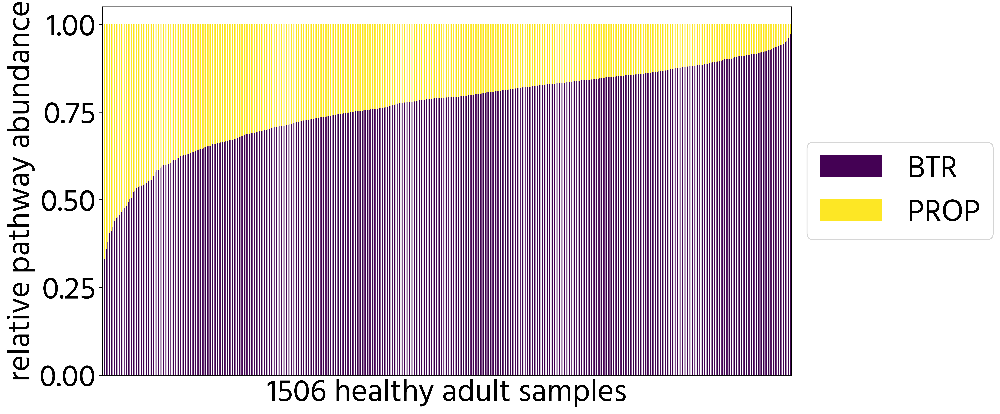

In [47]:
temp = adult_health_prop_but_normalised[["butyrate", "propionate"]]

temp = temp.rename(columns={"butyrate": "BTR", "propionate": "PROP"})

adult_health_prop_but_percent = percentageNormaliseOne(temp.transpose())

adult_healthy_sort_but_normalised = sortedStackedBar(adult_health_prop_but_percent.transpose(), sortBy="BTR", auto_name="title", x_name="1506 healthy adult samples")

plt.show()

In [44]:
adult_health_prop_but_percent

Unnamed: 0.1,ERR4330026,ERR4330027,ERR4330028,ERR4330029,ERR4330030,ERR4330031,ERR4330032,ERR4330033,ERR4330034,ERR4330035,...,ERR4341950,ERR4341951,ERR4341952,ERR4341953,ERR4341954,ERR4341955,ERR4341956,ERR4341957,ERR4341958,ERR4341959
BTR,0.643153,0.850103,0.9177,0.913493,0.870263,0.72573,0.822826,0.605432,0.875768,0.860159,...,0.77366,0.900864,0.739692,0.720217,0.840681,0.724806,0.793841,0.778281,0.709165,0.619137
PROP,0.356847,0.149897,0.0823,0.086507,0.129737,0.27427,0.177174,0.394568,0.124232,0.139841,...,0.22634,0.099136,0.260308,0.279783,0.159319,0.275194,0.206159,0.221719,0.290835,0.380863


In [40]:
temp

,BTR,PROP
Unnamed: 0.1,,
ERR4330026,0.546867,0.303424
ERR4330027,0.492404,0.086825
ERR4330028,0.712123,0.063864
ERR4330029,0.509120,0.048213
ERR4330030,0.783632,0.116822
...,...,...
ERR4341955,0.199793,0.075857
ERR4341956,0.722705,0.187685
ERR4341957,0.622190,0.177252


In [ ]:
sorted_acetylCoA_buk_normalised_percent = sortedStackedBar(overall_pathway_normalised_group_percent, "acetylCoA_buk")

In [ ]:
sorted_acetylCoA_but_normalised_percent = sortedStackedBar(overall_pathway_normalised_group_percent, "Ace (but)", title="Pathway Variations in Healthy Individuals", x_name="1973 samples across the Asnicar, Nayfach, and HMP 2019 studies")

<Figure size 640x480 with 0 Axes>

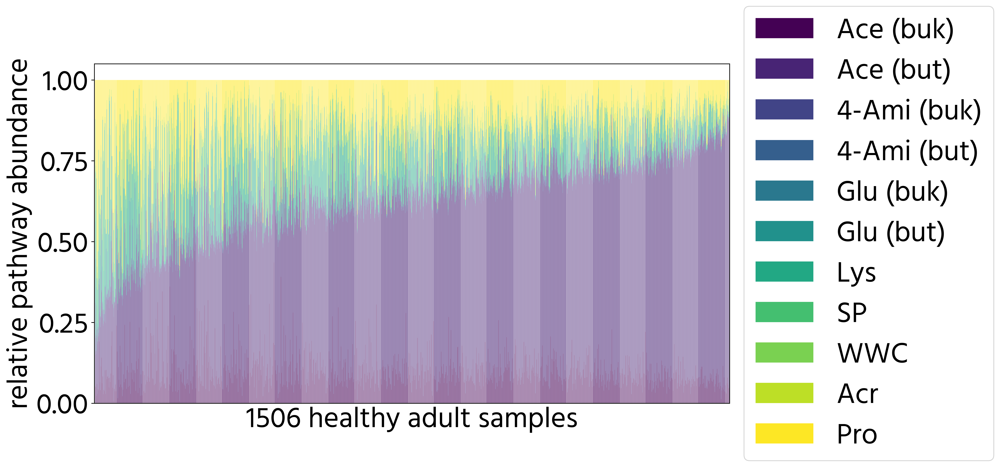

In [55]:
temp = adult_healthy_overall_group_normalised[list(pathway_length_dict.keys())]

adult_healthy_overall_group_percent = percentageNormaliseOne(temp.transpose())

adult_healthy_sort_acetylCoA_normalised = sortedStackedBar(adult_healthy_overall_group_percent.transpose(), sortBy="Ace (but)", auto_name="title", x_name="1506 healthy adult samples")

plt.show()

In [52]:
adult_healthy_overall_group_percent

,Ace (buk),Ace (but),4-Ami (buk),4-Ami (but),Glu (buk),Glu (but),Lys,SP,WWC,Acr,Pro
Unnamed: 0.1,,,,,,,,,,,
ERR4330026,0.001426,0.000375,0.000292,0.000547,0.037633,0.000808,0.000408,0.000000,0.000046,0.000048,0.002192
ERR4330027,0.000362,0.000898,0.000389,0.000289,0.000000,0.003727,0.000417,0.000448,0.000046,0.000565,0.000448
ERR4330028,0.000984,0.001071,0.000590,0.000583,0.012932,0.000000,0.000587,0.000250,0.000819,0.000284,0.000256
ERR4330029,0.000352,0.000922,0.000517,0.000970,0.000000,0.000000,0.000488,0.000005,0.000826,0.000408,0.000184
ERR4330030,0.000912,0.001428,0.000177,0.002000,0.000000,0.000583,0.000458,0.000000,0.000035,0.000893,0.000733
...,...,...,...,...,...,...,...,...,...,...,...
ERR4341955,0.000323,0.000351,0.000121,0.000042,0.000000,0.006585,0.000020,0.000010,0.002037,0.000166,0.000246
ERR4341956,0.001413,0.001009,0.000854,0.001002,0.000000,0.000462,0.001318,0.000090,0.000168,0.000804,0.001219
ERR4341957,0.000870,0.000931,0.000952,0.000220,0.000100,0.000241,0.001119,0.001740,0.000138,0.000738,0.000766


In [ ]:
sorted_propanediol_normalised_percent = sortedStackedBar(overall_pathway_normalised_group_percent, "propanediol pathway")

In [ ]:
phylum_percentage_df = percentageNormaliseOne(bacteroides_vs_firmicutes)

phylum_distribution_unsorted = plotStackedBar(stackedBarDF(phylum_percentage_df), "unsorted, noramlised, bacteroidetes vs firmicutes")

plt.show()

In [ ]:
plt.show()

In [ ]:
sorted_bacteroidetes_normalised_percent = sortedStackedBar(phylum_percentage_df, "Firmicutes", autoname=True, x_name = "3584 samples")
plt.show()

In [ ]:
adult_healthy_phylum_percentage_df = percentageNormaliseOne(adult_healthy_bacteroides_vs_firmicutes).transpose()

adult_healthy_sorted_bacteroidetes_normalised_percent = sortedStackedBar(adult_healthy_phylum_percentage_df, "Firmicutes", x_name = "1506 healthy adult samples", percent=False)
plt.show()

In [ ]:
adult_healthy_phylum_percentage_df

### scatter plots

In [ ]:
temp = adult_health_prop_but_normalised[["butyrate", "propionate"]]

healthy_adult_prop_vs_but_graph = plotScatter(temp, x_data="butyrate", y_data="propionate")
plt.show()

In [ ]:
prop_vs_but = prop_but_groupby.transpose()

prop_vs_but_graph = plotScatter(prop_vs_but, x_data="butyrate", y_data="propionate")
plt.show()

/home/daisy/mambaforge/envs/pathway_abundance/lib/python3.11/site-packages/pandas/plotting/_matplotlib/core.py:1258: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Figure size 3840x2880 with 0 Axes>

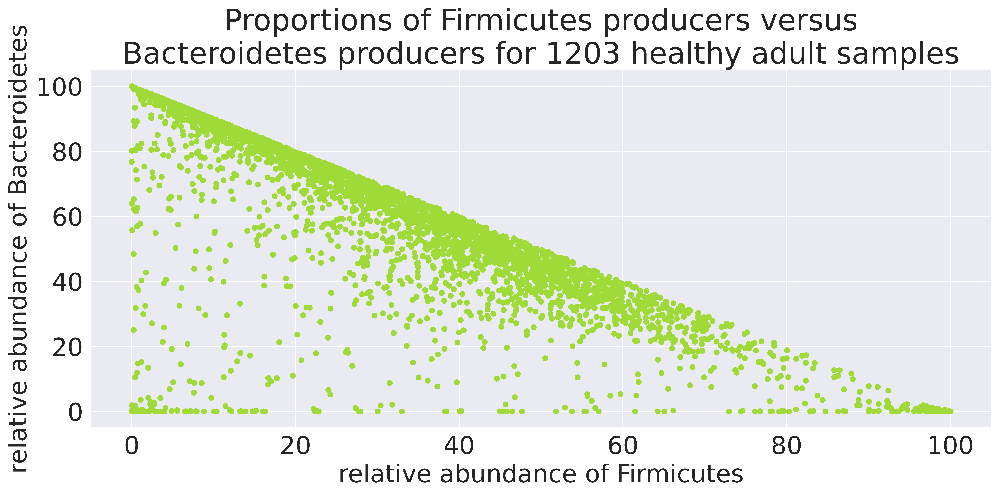

In [68]:
temp = bacteroides_vs_firmicutes.transpose()

bacteroides_vs_firmicutes = plotScatter(temp, x_data="Firmicutes", y_data="Bacteroidetes")
plt.show()

In [70]:
bacteroides_vs_firmicutes

In [ ]:
age_graph = plotScatterContinuous(with_metadata_prop_but_normalised, "butyrate", "propionate", "age")
plt.show()

In [ ]:
age_graph_percent = plotScatterContinuous(with_metadata_prop_but_percent, "butyrate", "propionate")

In [ ]:
age_graph = plotScatterContinuous(with_metadata_prop_but_normalised, "butyrate", "propionate", "age")
plt.show()

In [ ]:
age_graph_phyla = plotScatterContinuous(bacteroides_vs_firmicutes, "butyrate", "propionate", "age")
plt.show()

In [ ]:
bmi_graph = plotScatterContinuous(with_metadata_prop_but_normalised, "butyrate", "propionate", "BMI")
plt.show()

In [ ]:
# country_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "country")

In [ ]:
gender_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "gender")

In [ ]:
age_category_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "age_category")

In [ ]:
born_method_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "method of birth")

In [ ]:
feeding_practice_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "feeding practice")

In [ ]:
# pregnant_graph = plotScatterDiscrete(adult_health_prop_but_normalised, "butyrate", "propionate", "pregnant")

In [ ]:
disease_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "disease")

In [ ]:
lactating_graph = plotScatterDiscrete(adult_health_prop_but_normalised, "butyrate", "propionate", "lactating")

In [ ]:
infant_age_graph = plotScatterContinuous(with_metadata_prop_but_normalised, "butyrate", "propionate", "infant_age")
plt.show()

In [ ]:
family_role_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "family_role")

In [ ]:
days_since_collection_graph = plotScatterContinuous(with_metadata_prop_but_normalised, "butyrate", "propionate", "days_from_first_collection")
plt.show()

In [ ]:
antibiotics_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "antibiotics_current_use")

In [ ]:
disease_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "disease")

## line graphs

In [ ]:
with_metadata_prop_but_percent_change

In [ ]:
plotScatterLine(df=with_metadata_prop_but_percent_change, x_data = "age", y_data = "BTR % - PROP %")
plt.show()

In [ ]:
plotScatterLine(df=with_metadata_prop_but_percent_change, x_data = "age", y_data = "BTR - PROP")
plt.show()

In [ ]:
plotScatterLine(df=with_metadata_prop_but_percent_change, x_data = "infant_age", y_data = "BTR % - PROP %")
plt.show()

In [ ]:
# plotScatterLine(df=with_metadata_prop_but_percent_change, x_data = "infant_age", y_data = "BTR - PROP")
# plt.show()

In [ ]:
plotScatterLine(df=with_metadata_prop_but_percent_change, x_data = "infant_age", y_data = "propionate")
plt.show()

In [65]:
name = "Relative Abundance of BTR Pathways\nVs. Infant Age (days)"

g = plotScatterLine(df=with_metadata_prop_but_percent_change, x_data = "Infant Age (days)", y_data = "butyrate", name=name)

df = with_metadata_prop_but_percent_change[["Infant Age (days)", "butyrate"]].dropna()

# def annotate(data, **kws):
#     r, p = sp.stats.pearsonr(df['Infant Age (days)'], df['butyrate'])
#     ax = plt.gca()
#     ax.text(.05, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
#             transform=ax.transAxes)
    
# g.map_dataframe(annotate)

plt.show()

In [ ]:
plotViolin(df=with_metadata_prop_but_percent_change, x_data = "age_category", y_data = "BTR - PROP", c_data="age_category")
plt.show()

In [ ]:
plotViolin(df=with_metadata_prop_but_percent_change, x_data = "age_category", y_data = "BTR % - PROP %", c_data="age_category")
plt.show()

In [ ]:
plotViolin(df=with_metadata_prop_but_percent_change, x_data = "age_category", y_data = "butyrate", c_data="age_category")
plt.show()

In [ ]:
plotViolin(df=with_metadata_prop_but_percent_change, x_data = "feeding_practice", y_data = "BTR % - PROP %", c_data="feeding_practice")
plt.show()

In [ ]:
plotViolin(df=with_metadata_prop_but_percent_change, x_data = "feeding_practice", y_data = "BTR - PROP", c_data="feeding_practice")
plt.show()

In [ ]:
plotViolin(df=with_metadata_prop_but_percent_change, x_data = "feeding_practice", y_data = "butyrate", c_data="feeding_practice")
plt.show()

In [28]:
age_violin_df = violinDF(with_metadata_prop_but_percent_change, "age_category")

age_violin_df = age_violin_df.rename(columns={"age_category": "Age", "variable": "Pathway"})

adjusted_names = []

adjusted_pathways = []

adjusted_names_dict = {
    "Newborn": "Newborn\n≤ 1 month",
    "Infant": "Infant\n(1 month to 1 year)",
    "Child": "Child\n(1 to 12 years)",
    "Adolescent": "Adolescent\n(13 to 17 years)",
    "Adult": "Adult\n≥ 18 years",
    "Older Adult": "Older Adult\n≥ 65",
    np.nan: np.nan
}

adjusted_pathways_dict = {
    "butyrate": "BTR",
    "propionate": "PROP"
}

for curr in age_violin_df.Age:
    adjusted_names.append(adjusted_names_dict[curr])

for curr in age_violin_df.Pathway:
    adjusted_pathways.append(adjusted_pathways_dict[curr])


age_violin_df["Age"] = adjusted_names

age_violin_df["Pathway"] = adjusted_pathways

In [120]:
age_violin_df

,Pathway,Relative Abundance,Age
Unnamed: 0.1,,,
ERR4330026,BTR,0.546867,Adult\n≥ 18 years
ERR4330026,PROP,0.303424,Adult\n≥ 18 years
ERR4330027,BTR,0.492404,Adult\n≥ 18 years
ERR4330027,PROP,0.086825,Adult\n≥ 18 years
ERR4330028,BTR,0.712123,Adult\n≥ 18 years
...,...,...,...
SRR5983483,PROP,0.233556,NaN
SRR5983484,BTR,0.139418,NaN
SRR5983484,PROP,0.043641,NaN


In [62]:
title = "Relative Abundance of BTR and PROP Pathways Vs. Age"

plotViolin(df=age_violin_df, x_data = "Age", order_list=["Newborn\n≤ 1 month", "Infant\n(1 month to 1 year)", "Adult\n≥ 18 years", "Older Adult\n≥ 65"], y_data = "Relative Abundance", c_data="Pathway", split_option=True, name=title)
plt.show()

#### data preprocessing before I plot the graphs for feeding practices

In [43]:
feeding_practice_df = violinDF(with_metadata_prop_but_percent_change, "feeding_practice")

adjusted_names = []

feeding_practice_names = {
    "exclusively_breastfeeding": "Exclusively\nBreastfeeding",
    "mixed_feeding": "Mixed\nFeeding",
    "any_breastfeeding": "Any\nBreastfeeding",
    "no_breastfeeding": "No\nBreastfeeding",
    "exclusively_formula_feeding": "Exclusively\nFormula\nFeeding",
    np.nan: np.nan
}

for curr in feeding_practice_df.feeding_practice:
    adjusted_names.append(feeding_practice_names[curr])

feeding_practice_df["feeding_practice"] = adjusted_names

adjusted_pathways = []

adjusted_pathways_dict = {
    "butyrate": "BTR",
    "propionate": "PROP"
}

for curr in feeding_practice_df.variable:
    adjusted_pathways.append(adjusted_pathways_dict[curr])

feeding_practice_df["variable"] = adjusted_pathways


feeding_practice_df = feeding_practice_df.rename(columns={"feeding_practice": "Feeding Practice"}).rename(columns={"variable": "Pathway"})

In [44]:
feeding_practice_df

,Pathway,Relative Abundance,Feeding Practice
Unnamed: 0.1,,,
ERR4330026,BTR,0.546867,NaN
ERR4330026,PROP,0.303424,NaN
ERR4330027,BTR,0.492404,NaN
ERR4330027,PROP,0.086825,NaN
ERR4330028,BTR,0.712123,NaN
...,...,...,...
SRR5983483,PROP,0.233556,NaN
SRR5983484,BTR,0.139418,NaN
SRR5983484,PROP,0.043641,NaN


In [86]:
title = "Relative Abundance of BTR and PROP Pathways Vs. Feeding Practices"

plotViolin(df=feeding_practice_df, x_data = "Feeding Practice", order_list=["Exclusively\nBreastfeeding", "Mixed\nFeeding", "Any\nBreastfeeding", "No\nBreastfeeding", "Exclusively\nFormula\nFeeding"], y_data = "Relative Abundance", c_data="Pathway", split_option=True, name=title)

plt.show()

In [74]:
title = "Relative Abundance of BTR and PROP Pathways Vs. Feeding Practices"

# plotViolin(df=feeding_practice_df, x_data = "Feeding Practice", order_list=["Exclusively\nBreastfeeding", "Mixed\nFeeding", "Any\nBreastfeeding", "No\nBreastfeeding", "Exclusively\nFormula\nFeeding"], y_data = "Relative Abundance", c_data="Pathway", split_option=True, name=title)

temp = feeding_practice_df.dropna()

sns.swarmplot(data=temp, x="Feeding Practice")

plt.show()

/home/daisy/mambaforge/envs/pathway_abundance/lib/python3.11/site-packages/seaborn/categorical.py:3544: UserWarning: 97.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/daisy/mambaforge/envs/pathway_abundance/lib/python3.11/site-packages/seaborn/categorical.py:3544: UserWarning: 64.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


KeyboardInterrupt: 